In [1]:
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection
from sklearn import manifold, preprocessing
from sklearn.metrics import euclidean_distances
from sklearn.decomposition import PCA
import warnings

The code failed because of a fatal error:
	Error sending http request and maximum retry encountered..

Some things to try:
a) Make sure Spark has enough available resources for Jupyter to create a Spark context.
b) Contact your Jupyter administrator to make sure the Spark magics library is configured correctly.
c) Restart the kernel.


In [2]:
work_dir = os.path.expanduser('~/Google_Drive/olson_lab/projects/relationship_knowledge/surveys/lit_dimensions_all_relationships')
output_dir = work_dir+'/results'
os.chdir(work_dir)

In [4]:
# Grab the qualtrics output
qual_output = [i for i in os.listdir('./') if i.startswith('RK')][0]

# Prep responses and key
raw = pd.read_csv(qual_output)
raw_reorg = raw.drop(axis='index',index=[0,1])
raw_reorg['subject'] = list(raw_reorg.index)
raw_reorg = raw_reorg.reset_index(drop=True)
raw_reorg['Duration (in seconds)'] = pd.to_numeric(raw_reorg['Duration (in seconds)'])
key = pd.read_csv('qualtrics_question_key.csv')

responses = raw_reorg
responses['subject'] = list(raw_reorg.index)
responses = responses.loc[:, responses.columns.str.startswith('Q')]
responses = responses[responses.columns[1:-7]]

# Get total number of responses
print("Total number of responses from qualtrics - "+str(len(responses)))

warnings.filterwarnings('ignore')

Total number of responses from qualtrics - 1065


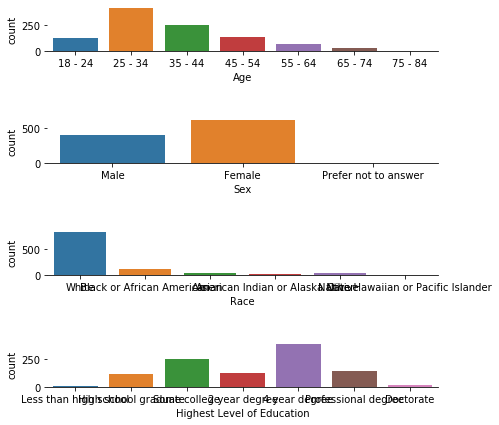

In [5]:
# Demographics
demo_orig = pd.read_csv(qual_output, header=1, 
                           usecols=range(len(raw_reorg.iloc[0])-9,
                                         len(raw_reorg.iloc[0])-1))
demo_orig = demo_orig.drop(axis='index',index=0)
demographics = demo_orig
#demographics = demographics.drop(axis='index',index=0)


# Plot demographic information
# Set up the matplotlib figure
#sns.set(font_scale=1.2)
#sns.set_style("whitegrid")
f, axes = plt.subplots(4, 1, figsize=(7, 7), sharex=False)
f.subplots_adjust(wspace = 10, hspace=1.5)
sns.despine(left=True)
sns.countplot(demographics['Age'], ax=axes[0], order=['18 - 24', '25 - 34',
                                                      '35 - 44', '45 - 54',
                                                      '55 - 64', '65 - 74',
                                                      '75 - 84'])
sns.countplot(demographics['Sex'], ax=axes[1])
sns.countplot(demographics['Race'], ax=axes[2])
sns.countplot(demographics['Highest Level of Education'], ax=axes[3],
              order=['Less than high school', 'High school graduate',
                     'Some college', '2 year degree', '4 year degree',
                     'Professional degree','Doctorate'])


***
### Create a dictionary that will store dataframes for each dimensions
### Dataframes have ratings all relationships

In [6]:
filter_col = [col for col in raw if col.startswith('Q8.2')]
#relationships = [x for x in raw.iloc[0].tolist() if x.startswith('Q8.2')]
#relationships = [x for x in raw.columns.tolist() if x.startswith('Q8.2')]
relationships = raw[filter_col].iloc[0]
relationships = [s.replace('\xe2\x80\x93', '-') for s in relationships]
relationships = [i.split(' - ', 1)[1] for i in relationships]
dimension_frames = {}
count=2
for dim in key['dimension'].tolist()[2:-3]:  # exclude foil and demographics
    filtered_cols = [col for col in raw_reorg if col.startswith('Q'+str(key['block'].iloc[count])+'.2')]
    dimension_frames[dim] = pd.DataFrame(responses[filtered_cols])
    dimension_frames[dim].columns = relationships
    # Delete all data for "between cousins" and only keep "second cousins"
    #dimension_frames[dim]['Between second cousins'].iloc[:629] = np.nan
    count=count+1


### Check total number of responses for each word before and after removing bad participants
Foil questions were used to catch participants who were not paying attention or taking the survey seriously

No handles with labels found to put in legend.
No handles with labels found to put in legend.


10
28
Total number of responses, excluding bad participants - 817


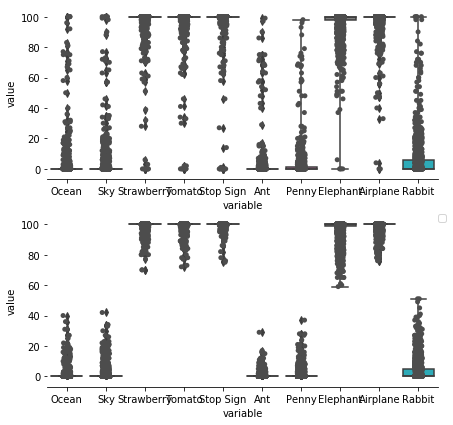

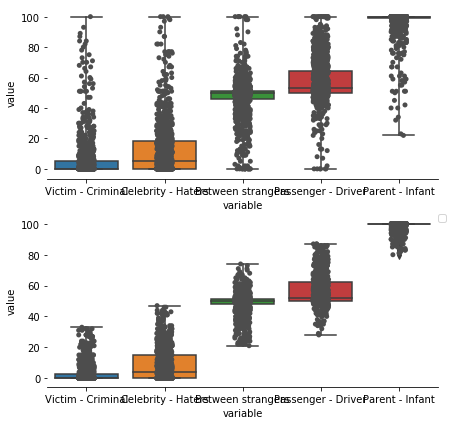

In [7]:
# Check total number of responses for each word
num_response = []
for col in dimension_frames['Coercion'].columns:
    num_response.append(dimension_frames['Coercion'][col].count())
#plt.figure()
#sns.barplot(x=relationships,y=num_response)


# Check color foils to exclude people
foil_items = [x for x in raw.columns.tolist() if x.startswith('Q2.1')]
foil_items = foil_items + [x for x in raw.columns.tolist() if x.startswith('Q35.1')]
foil_items = raw[foil_items].iloc[0]
foil_items = [s.replace('\xe2\x80\x93', '-') for s in foil_items]
foil_items = [i.split(' - ', 1)[1] for i in foil_items]
filtered_cols = [col for col in raw_reorg if col.startswith(('Q2.1','Q35.1'))]
foils_color_size = pd.DataFrame(responses[filtered_cols])
foils_color_size.columns = foil_items
foils_color_size['MTurkCode']  =raw_reorg['MTurkCode']
foils_color_size = foils_color_size.apply(pd.to_numeric)
"""foils = all_resp_melt.loc[all_resp_melt['word'].isin(['Movie','Fire','Jackpot',
                                                      'Deathbed','Car'])]
foils_melt = all_resp_melt.loc[all_resp_melt['word'].isin(['Movie','Fire','Jackpot',
                                                      'Deathbed','Car'])]"""
foils_color_size_melt = pd.melt(foils_color_size, id_vars='MTurkCode')

# Check for values above means for unexpected foils
outliers_color_size_list = []
for col in foils_color_size.columns[:-1]:
    outliers_color_size_list = outliers_color_size_list + list(foils_color_size[(foils_color_size[col] > 
                   foils_color_size[col].mean()+foils_color_size[col].std()*3.5) |
                   (foils_color_size[col] < 
                    foils_color_size[col].mean()-foils_color_size[col].std()*3.5)].index)
outliers_color_size_list = set(outliers_color_size_list)


# Remove outliers based on assumptions of words
# Frequency of deathbed > car
# Removing subjects based on completetion time is not the best (they do okay)
foil_color_size_outliers = foils_color_size
foil_color_size_outliers = foil_color_size_outliers[~foil_color_size_outliers.index.isin(outliers_color_size_list)]
foil_color_size_outliers_melt = pd.melt(foil_color_size_outliers, id_vars='MTurkCode')

#foil_outliers = foils[~foils.index.isin(outliers_list)]

f, axes = plt.subplots(2, 1, figsize=(7, 7), sharex=False)
sns.despine(left=True)
sns.stripplot(x="variable", y="value", data=foils_color_size_melt, 
              color='.3', jitter=True, ax=axes[0])
#axes[0].legend_.remove()
sns.stripplot(x="variable", y="value", data=foil_color_size_outliers_melt, 
              color='.3', jitter=True,  ax=axes[1])
sns.boxplot(x="variable", y="value", data=foils_color_size_melt, whis=np.inf, ax=axes[0])
sns.boxplot(x="variable", y="value", data=foil_color_size_outliers_melt, whis=np.inf, ax=axes[1])
plt.legend(bbox_to_anchor=(1, 1), loc=2, borderaxespad=0.0)


# Get MTurk codes for outliers
outliers_foil_df = foils_color_size.iloc[list(outliers_color_size_list)]
outliers_df = raw_reorg.iloc[list(outliers_color_size_list)]
outliers_df.to_csv('exclusion_list.csv')


# Check foils to see if any subjs responded indiscriminately
foil_relationships = [x for x in raw.iloc[0].tolist() if x.startswith('Q34')]
foil_relationships = [x[6:] for x in foil_relationships]
foil_relationships = [x for x in raw.columns.tolist() if x.startswith('Q34.1')]
foil_relationships = raw[foil_relationships].iloc[0]
foil_relationships = [s.replace('\xe2\x80\x93', '-') for s in foil_relationships]
foil_relationships = [i.split(' - ', 1)[1] for i in foil_relationships]
filtered_cols = [col for col in raw_reorg if col.startswith('Q34.1')]
foils = pd.DataFrame(responses[filtered_cols])
foils.columns = foil_relationships
foils['MTurkCode']  =raw_reorg['MTurkCode']
foils = foils.apply(pd.to_numeric)
foils_melt = pd.melt(foils, id_vars='MTurkCode')

# Check for values above means for unexpected foils
outliers_list = []
for rel in foils.columns[:-1]:
    outliers_list = outliers_list + list(foils[(foils[rel] > 
                   foils[rel].mean()+foils[rel].std()*2) |
                   (foils[rel] < 
                    foils[rel].mean()-foils[rel].std()*2)].index)
outliers_list = set(outliers_list)



# Remove outliers based on assumptions of words
# Frequency of deathbed > car
# Removing subjects based on completetion time is not the best (they do okay)
foil_outliers = foils
foil_outliers = foil_outliers[~foil_outliers.index.isin(outliers_list)]
foil_outliers_melt = pd.melt(foil_outliers, id_vars='MTurkCode')

#foil_outliers = foils[~foils.index.isin(outliers_list)]

f, axes = plt.subplots(2, 1, figsize=(7, 7), sharex=False)
sns.despine(left=True)
sns.stripplot(x="variable", y="value", data=foils_melt, 
              color='.3', jitter=True, ax=axes[0])
#axes[0].legend_.remove()
sns.stripplot(x="variable", y="value", data=foil_outliers_melt, 
              color='.3', jitter=True,  ax=axes[1])
sns.boxplot(x="variable", y="value", data=foils_melt, whis=np.inf, ax=axes[0])
sns.boxplot(x="variable", y="value", data=foil_outliers_melt, whis=np.inf, ax=axes[1])
plt.legend(bbox_to_anchor=(1, 1), loc=2, borderaxespad=0.0)



# Remove relationship ratings where subjects indicated that they did not 
    # understand the relationships
filtered_cols = [col for col in raw_reorg if col.startswith(('Q3.1'))]
familiarity = pd.DataFrame(raw_reorg[filtered_cols])
familiarity.columns = relationships
familiarity['MTurkCode'] = raw_reorg['MTurkCode']
familiarity = familiarity.apply(pd.to_numeric)


familiarity_melt = pd.melt(familiarity, id_vars='MTurkCode')

# Check for values above means for unexpected foils
familiarity_list = []
for col in familiarity.columns[:-1]:
    familiarity_list = familiarity_list + list(familiarity[(familiarity[col] > 
                   familiarity[col].mean()+familiarity[col].std()*3.5) |
                   (familiarity[col] < 
                    familiarity[col].mean()-familiarity[col].std()*3.5)].index)
familiarity_list = set(familiarity_list)


# Remove outliers from the rest of the data
outliers_all_list = set(list(outliers_list) + list(outliers_color_size_list) + list(familiarity_list))
dimension_frames_outliers = dimension_frames.copy()
for dim in dimension_frames_outliers:
    dimension_frames_outliers[dim] = dimension_frames[dim][~dimension_frames[dim].index.isin(outliers_all_list)]
    dimension_frames_outliers[dim] = dimension_frames_outliers[dim].apply(pd.to_numeric)




# Check total number of responses for each word with outliers excluded
num_response = []
for col in dimension_frames_outliers['Coercion'].columns:
    num_response.append(dimension_frames_outliers['Coercion'][col].count())



count_dim_rel = pd.DataFrame(columns=dimension_frames_outliers.keys())
for dim in dimension_frames_outliers.keys():
        count_dim_rel[dim] = dimension_frames_outliers[dim].count()
print(min(count_dim_rel[dim]))
print(max(count_dim_rel[dim]))
print("Total number of responses, excluding bad participants - "+str(len(dimension_frames_outliers[dim])))


### Relationships by Dimensions Matrix

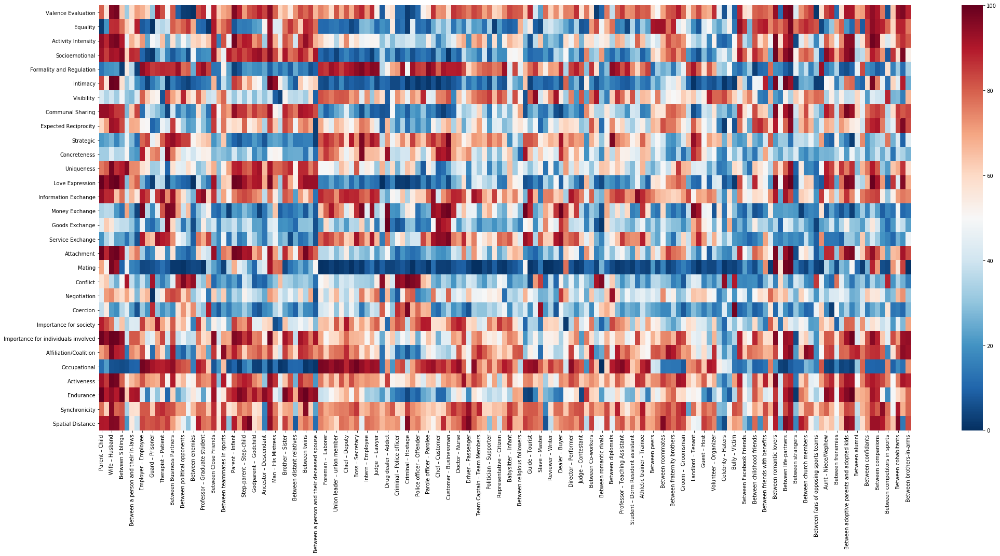

In [8]:
dim_rel = pd.DataFrame(columns=relationships)
count=0
col_names = []
for dim in dimension_frames_outliers.keys():
    dim_rel.loc[count] = dimension_frames_outliers[dim].mean().tolist()
    col_names.append(dim)
    count = count + 1
dim_rel.index = dimension_frames_outliers.keys()

dim_rel.to_csv(output_dir+'/dim_rel.csv')

#ax = sns.heatmap(dim_rel)
plt.figure(figsize=(30,15))
heatmap = sns.heatmap(dim_rel, center=50,cmap="RdBu_r")
fig = heatmap.get_figure()
plt.tight_layout()
fig.savefig(output_dir+'/dim_rel_heatmap.png')

dim_rel_scaled = preprocessing.scale(dim_rel.transpose())
dim_rel_scaled_df = pd.DataFrame(dim_rel_scaled, index=dim_rel.columns,
                                 columns=dim_rel.index)
dim_rel_scaled_df.to_csv(output_dir+'/dim_rel_scaled.csv')


***
# PCA with Rotation in R

In [78]:
library(factoextra)
library(lattice)
#library(tidyverse)
library(gridExtra)
library(viridis)
library(corrplot)
library(psych)
library(GPArotation)
theme_set(theme_minimal())
theme_update(
text = element_text(size = 20)
)
setwd("~/Google_Drive/olson_lab/projects/relationship_knowledge/surveys/lit_dimensions_all_relationships/")
getwd()

[1] "/Users/tuk12127/Google_Drive/olson_lab/projects/relationship_knowledge/surveys/lit_dimensions_all_relationships"

In [12]:
dim_rel_scaled = read.csv('results/dim_rel_scaled.csv', row.names=1)
#relationships = dim_rel_scaled[1]
#dim_rel_scaled = dim_rel_scaled[,2:31]

pca.res <- prcomp(dim_rel_scaled)
summary(pca.res)

Importance of components:
                          PC1    PC2     PC3     PC4    PC5    PC6     PC7
Standard deviation     3.5932 2.4290 1.53392 1.48947 1.1900 1.0101 0.78531
Proportion of Variance 0.4277 0.1954 0.07794 0.07349 0.0469 0.0338 0.02043
Cumulative Proportion  0.4277 0.6231 0.70104 0.77453 0.8214 0.8552 0.87565
                          PC8     PC9    PC10    PC11    PC12   PC13    PC14
Standard deviation     0.7553 0.65809 0.59313 0.55847 0.52023 0.4854 0.46121
Proportion of Variance 0.0189 0.01435 0.01165 0.01033 0.00896 0.0078 0.00705
Cumulative Proportion  0.8945 0.90890 0.92055 0.93088 0.93984 0.9476 0.95469
                          PC15    PC16    PC17   PC18    PC19    PC20    PC21
Standard deviation     0.43296 0.41575 0.35428 0.3476 0.33629 0.32195 0.29004
Proportion of Variance 0.00621 0.00573 0.00416 0.0040 0.00375 0.00343 0.00279
Cumulative Proportion  0.96090 0.96663 0.97079 0.9748 0.97854 0.98197 0.98476
                         PC22    PC23    PC24    PC25 

In [14]:
rawLoadings     <- pca.res$rotation[,1:4]
rotatedLoadings <- varimax(rawLoadings)
rotatedLoadings

$loadings

Loadings:
                                    PC1    PC2    PC3    PC4   
Valence.Evaluation                                -0.405       
Equality                            -0.255 -0.114              
Activity.Intensity                          0.338              
Socioemotional                      -0.260                     
Formality.and.Regulation             0.305                     
Intimacy                            -0.250  0.172              
Visibility                           0.310               -0.162
Communal.Sharing                    -0.121        -0.140 -0.204
Expected.Reciprocity                -0.117  0.104 -0.212  0.153
Strategic                            0.206                0.207
Concreteness                                              0.373
Uniqueness                          -0.176  0.267              
Love.Expression                     -0.144  0.101 -0.183 -0.107
Information.Exchange                 0.246  0.225 -0.219       
Money.Exchange     

In [15]:
# fit PCA
pcafit <- prcomp(dim_rel_scaled)
# reconstruct data matrix
recon <- t(t(pcafit$x %*% t(pcafit$rotation)))  # note that we would have to add back in the mean if we hadn't already z-scored the data
# compare to original data matrix
#sqrt(mean((recon-dim_rel_scaled)^2))  # RMSE of recon ~0

In [16]:
# reconstruct data matrix
recon <- t(t(pcafit$x[,1:30] %*% t(pcafit$rotation[,1:30])))
# compare to original data matrix
#sqrt(mean((recon-d60)^2))

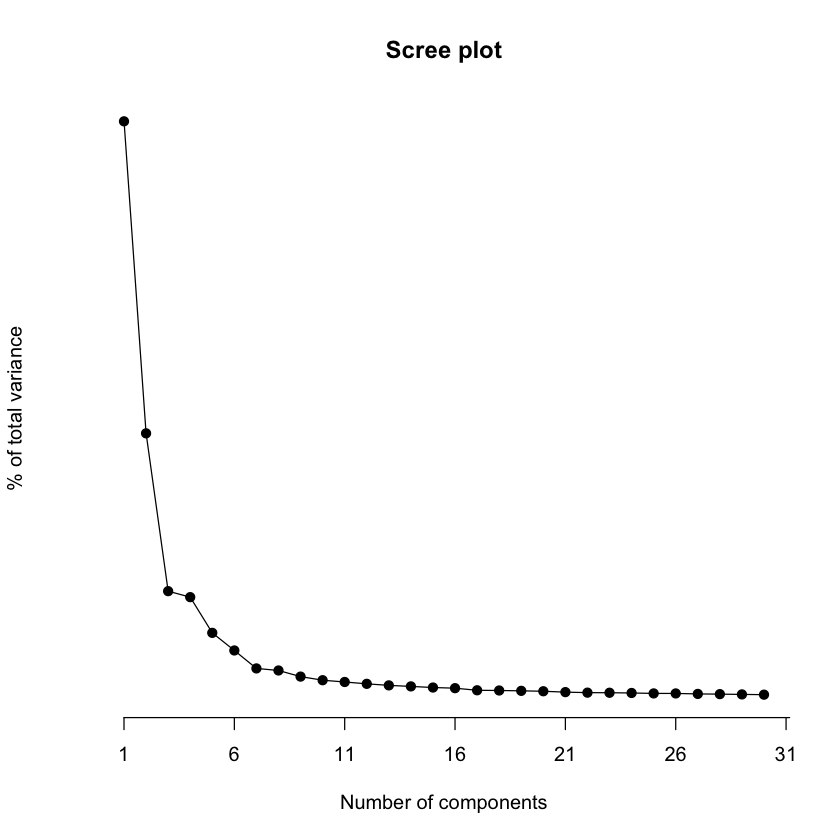

In [17]:
# make scree plot
plot(pcafit$sdev^2/dim(dim_rel_scaled)[2]*100,axes=F,pch=19,type="o",
     xlab="Number of components",ylab="% of total variance",main="Scree plot")
axis(1,seq(1,59,5))

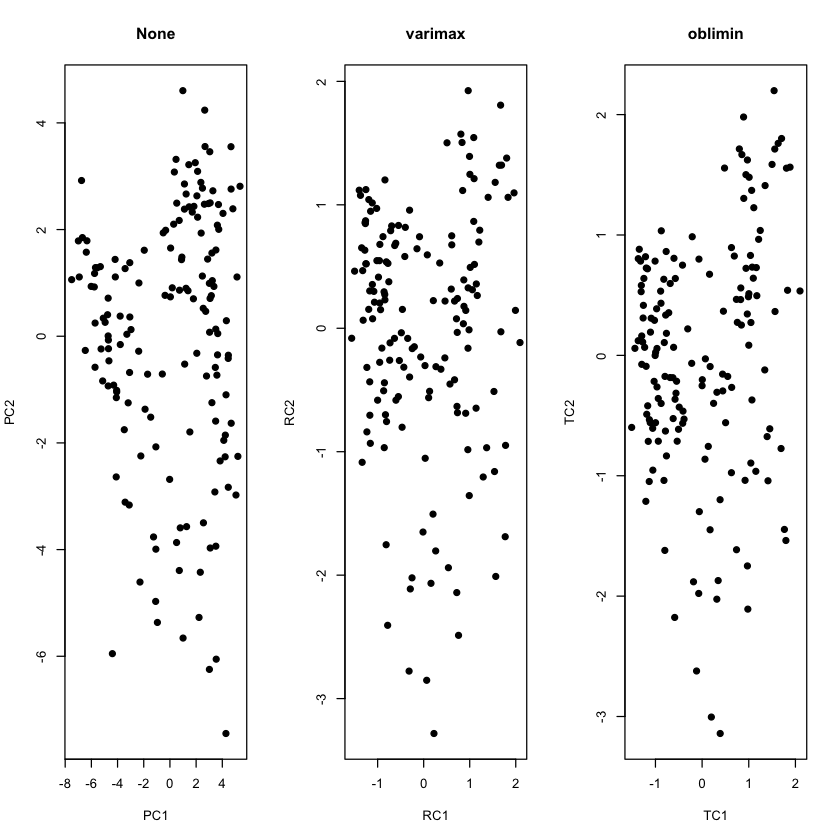

In [18]:
pv <- principal(dim_rel_scaled, 4, rotate="varimax")
po <- principal(dim_rel_scaled, 4, rotate="oblimin")
pal <- colorRamp(c("blue","grey","red"))
layout(matrix(c(1:3),1,3))
plot(pcafit$x[,1:2],pch=19,main="None")
plot(pv$scores,pch=19,main="varimax")
plot(po$scores,pch=19,main="oblimin")

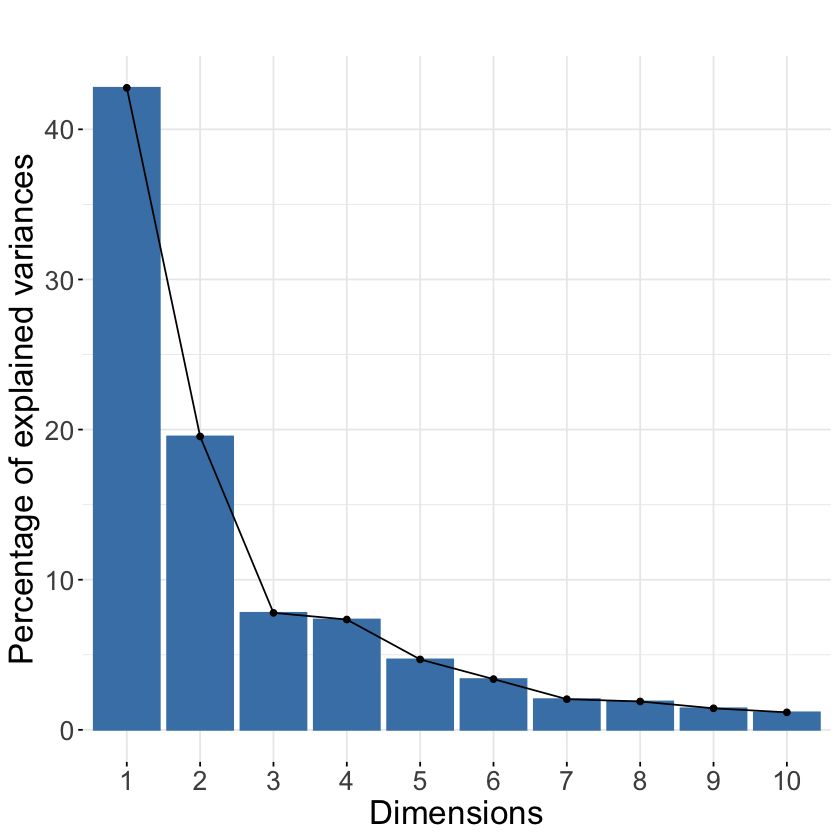

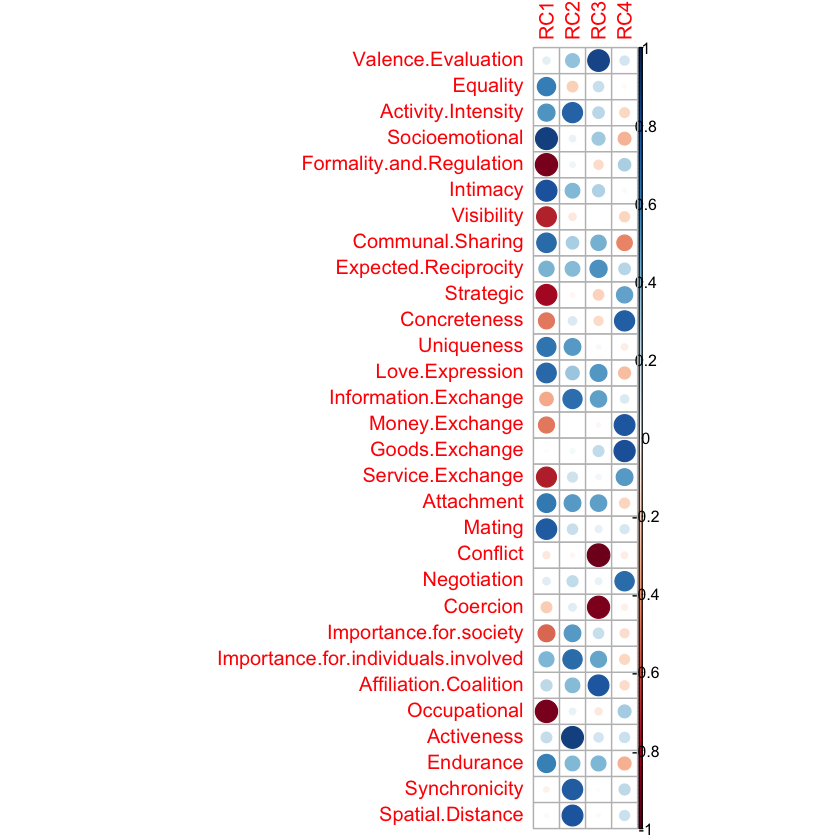

In [31]:
fviz_eig(pca.res) + ggtitle("") +
theme(text = element_text(size = 20))

corrplot(pv$loadings)

## Quantitatively selecting the number of components

### Parallel Analysis

Parallel analysis suggests that the number of factors =  NA  and the number of components =  4 


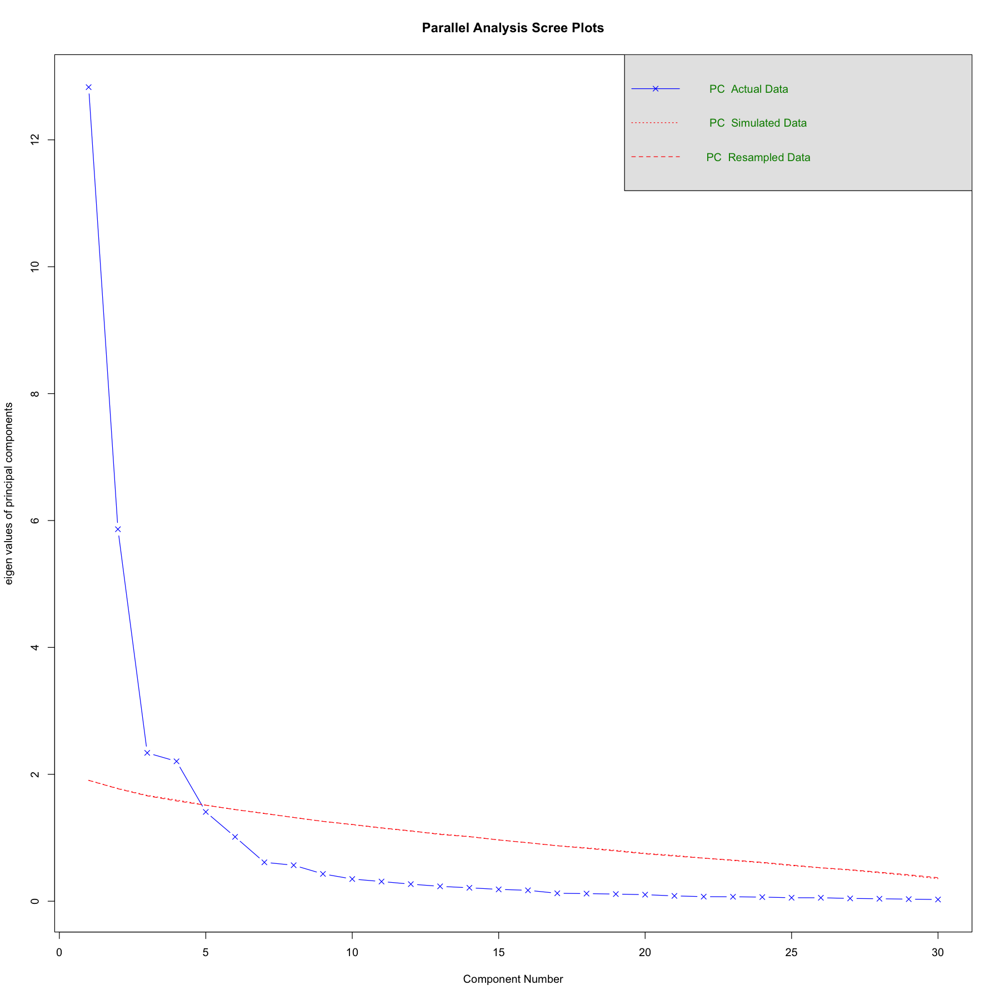

In [46]:
fa.parallel(dim_rel_scaled,fa="pc")

The ideal number of components is 4

## Correlation Circle
Arrow lengths indicate loading scores, where the x-value of an arrow is the loading on the x-component

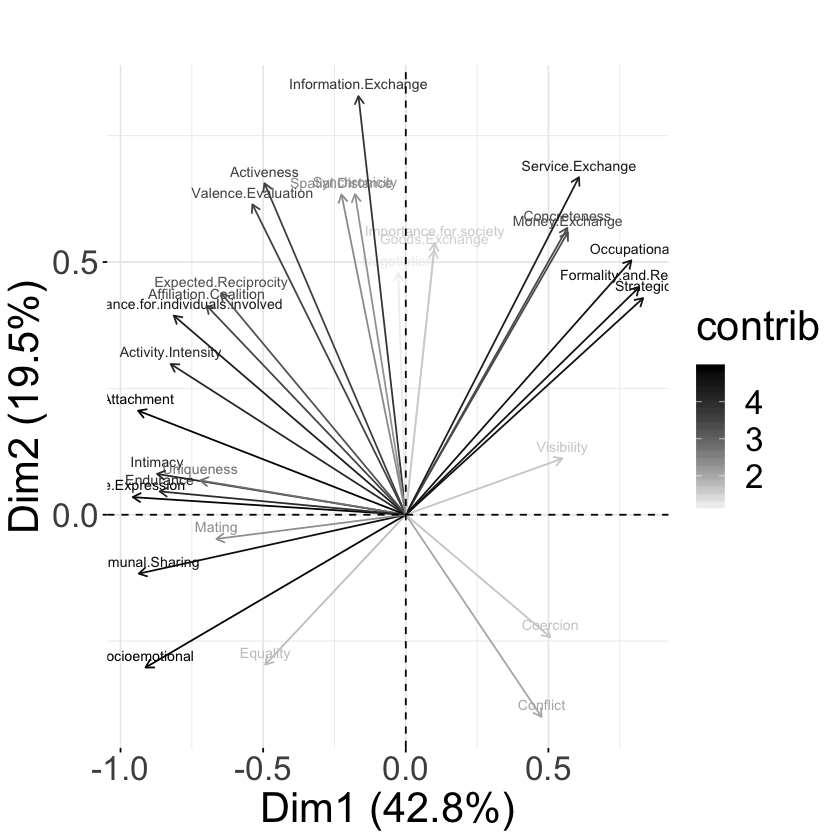

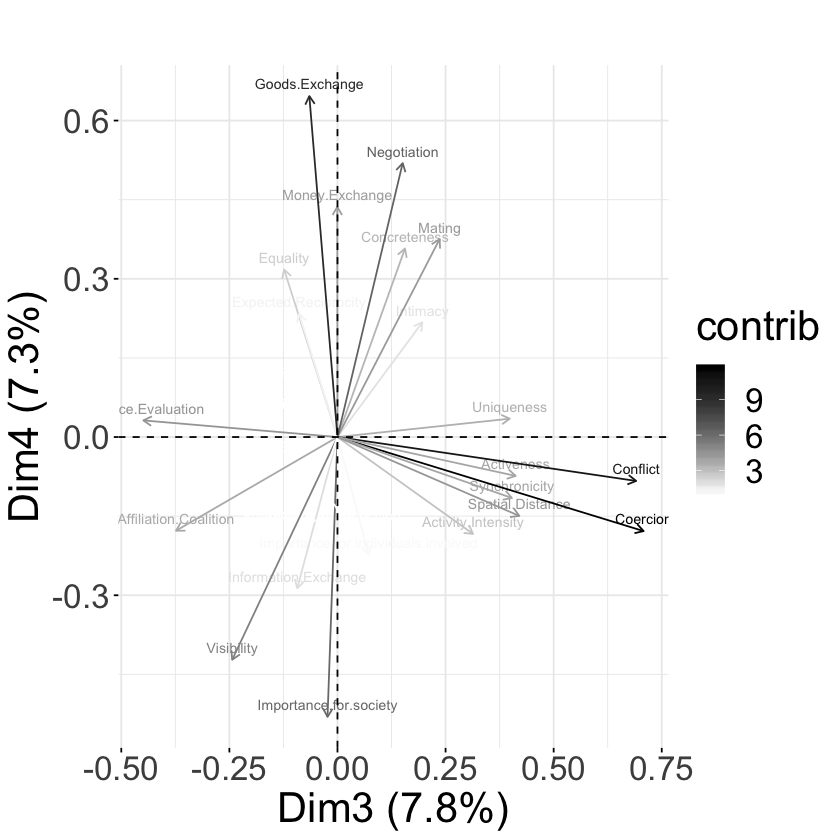

In [19]:
fviz_pca_var(pca.res, labelsize = 3, col.var="contrib") +
    scale_color_gradient2(low="white", mid="white", 
                          high="black", midpoint=1) + 
    ggtitle("") + theme(text = element_text(size = 25))

fviz_pca_var(pca.res, axes=c(3,4), labelsize = 3, col.var="contrib") +
    scale_color_gradient2(low="white", mid="white", 
                          high="black", midpoint=1) + 
    ggtitle("") + theme(text = element_text(size = 25))

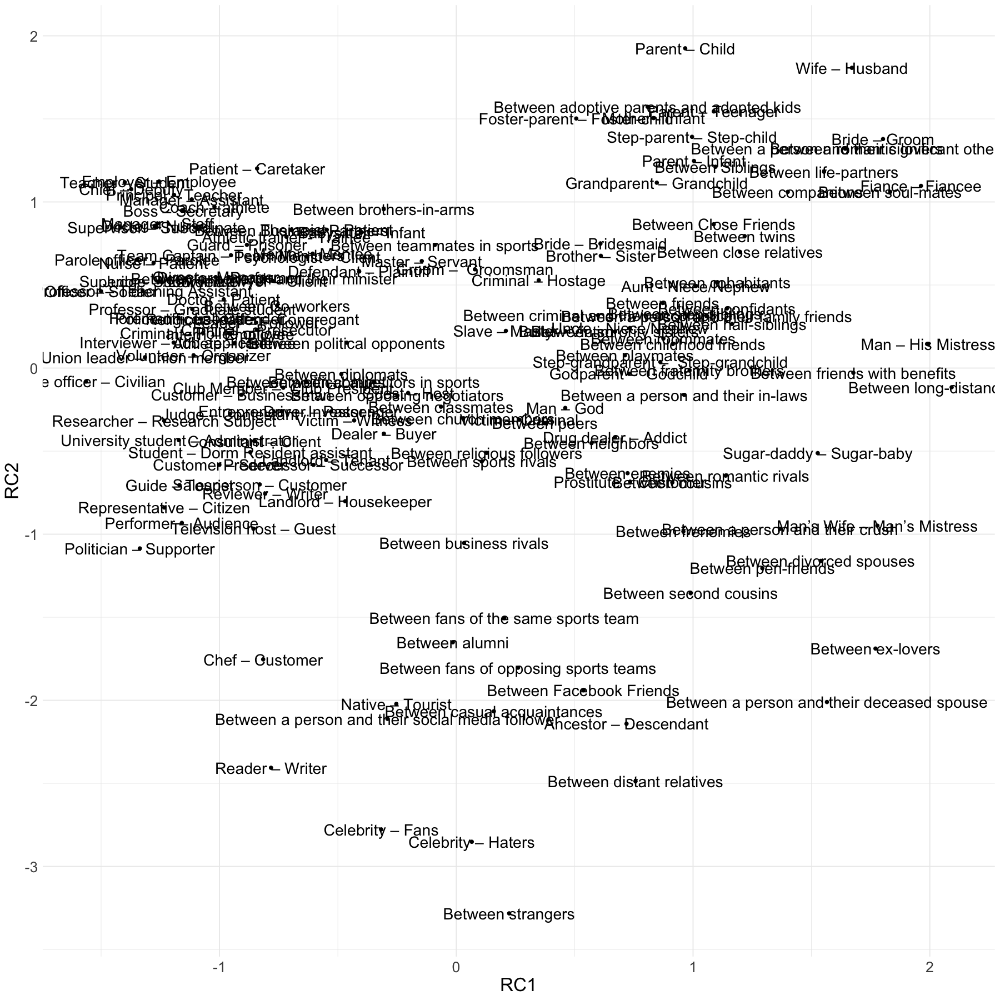

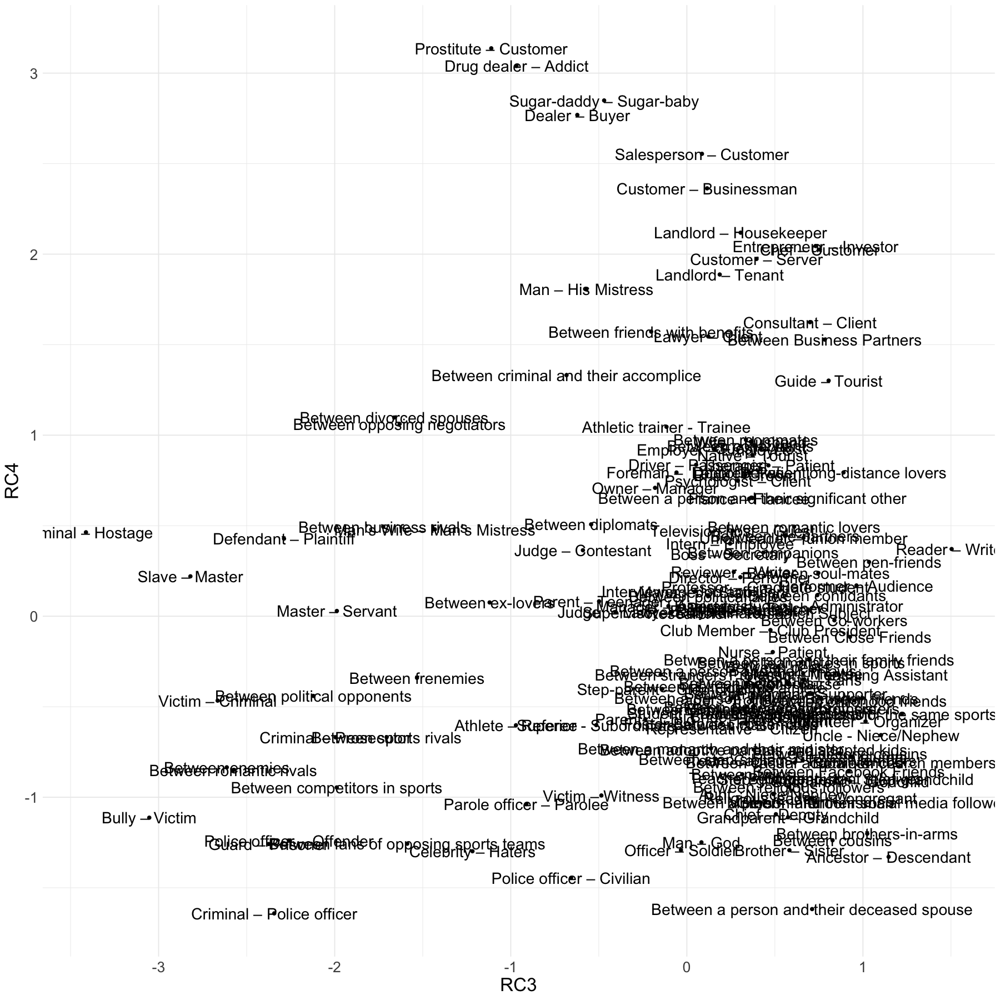

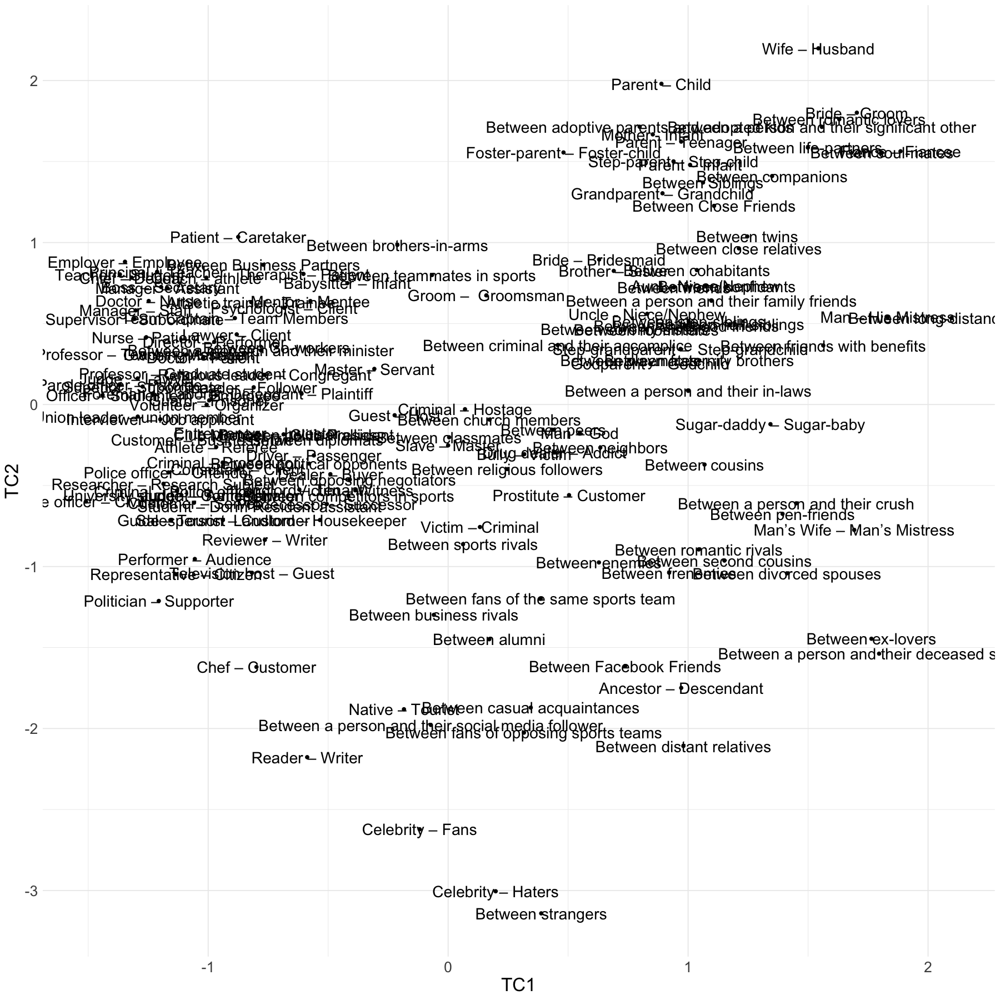

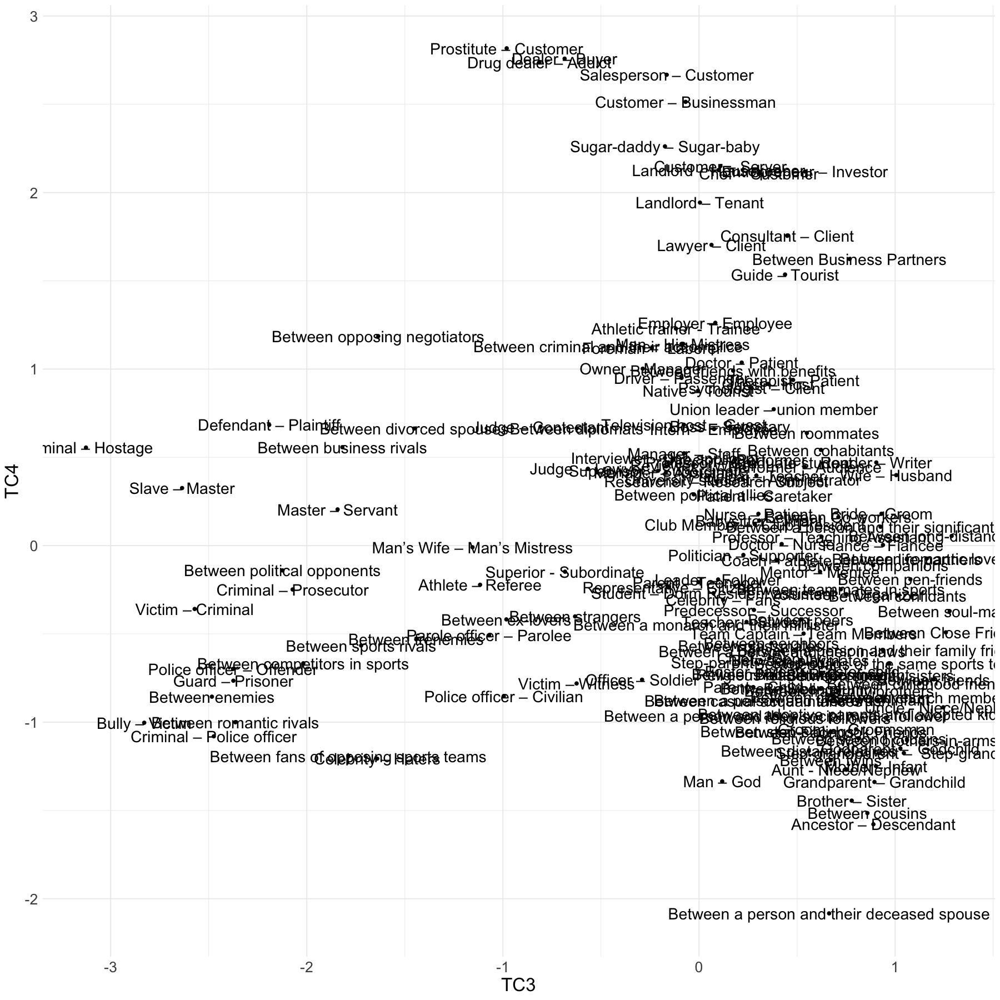

In [40]:
fig <- function(width, heigth){
     options(repr.plot.width = width, repr.plot.height = heigth)
}

fig(15, 15)

ggplot(as.data.frame(pv$scores), aes(x=RC1, y=RC2)) +
  geom_point() + 
  geom_text(label=rownames(pv$scores), size=6)

ggplot(as.data.frame(pv$scores), aes(x=RC3, y=RC4)) +
  geom_point() + 
  geom_text(label=rownames(pv$scores), size=6)

ggplot(as.data.frame(po$scores), aes(x=TC1, y=TC2)) +
  geom_point() + 
  geom_text(label=rownames(pv$scores), size=6)

ggplot(as.data.frame(po$scores), aes(x=TC3, y=TC4)) +
  geom_point() + 
  geom_text(label=rownames(pv$scores), size=6)

options(warn=-1)

## Names for components:
Components are replicated: the R PCA function with rotation are similar to the python PCA components

PC1 - Formality (socioemotional vs task-oriented)

PC2 - Concreteness (exchange tangible vs symbolic resource)

PC3 - Conflict & Coercion

PC4 - Societal Importance (socialism vs capitalism)


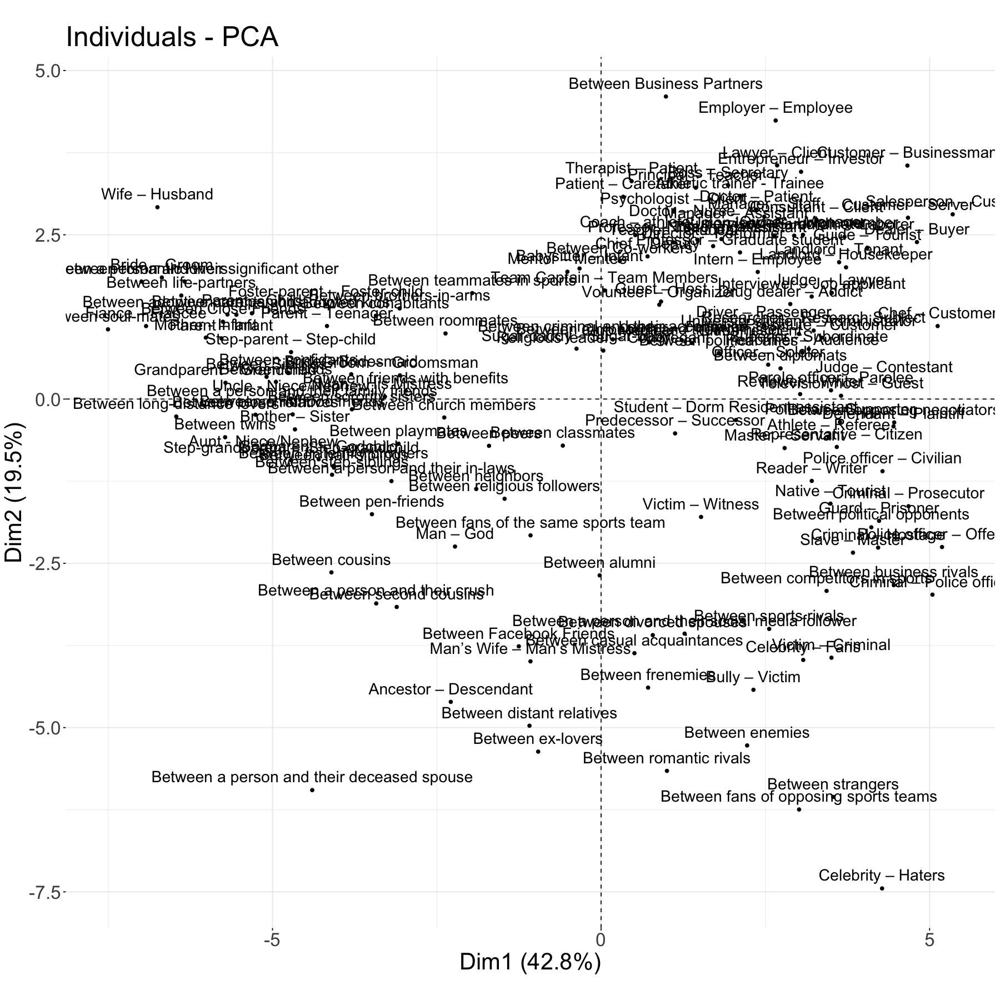

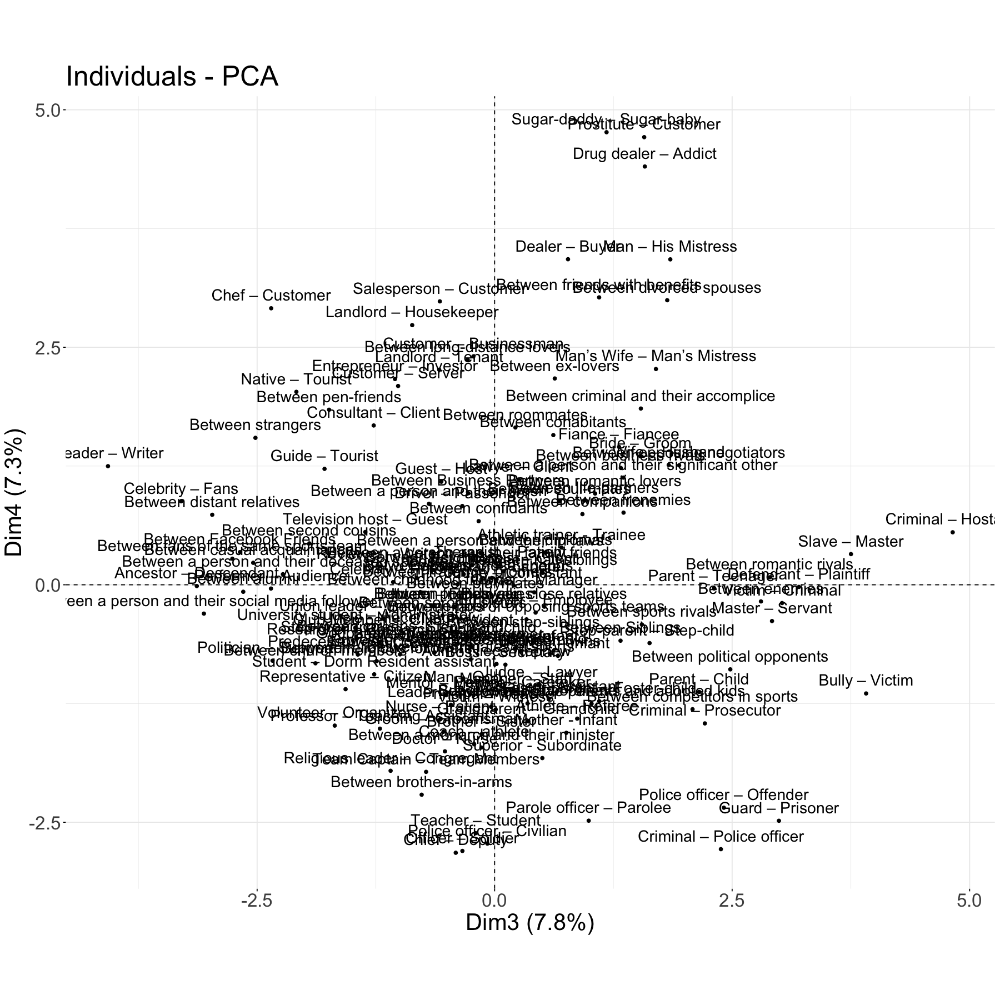

In [43]:
options(warn=-1)

fviz_pca_ind(pca.res, labelsize=6) +
    coord_fixed() + theme(text = element_text(size = 25))

fviz_pca_ind(pca.res, axes=c(3,4), labelsize=6) +
    coord_fixed() + theme(text = element_text(size = 25))

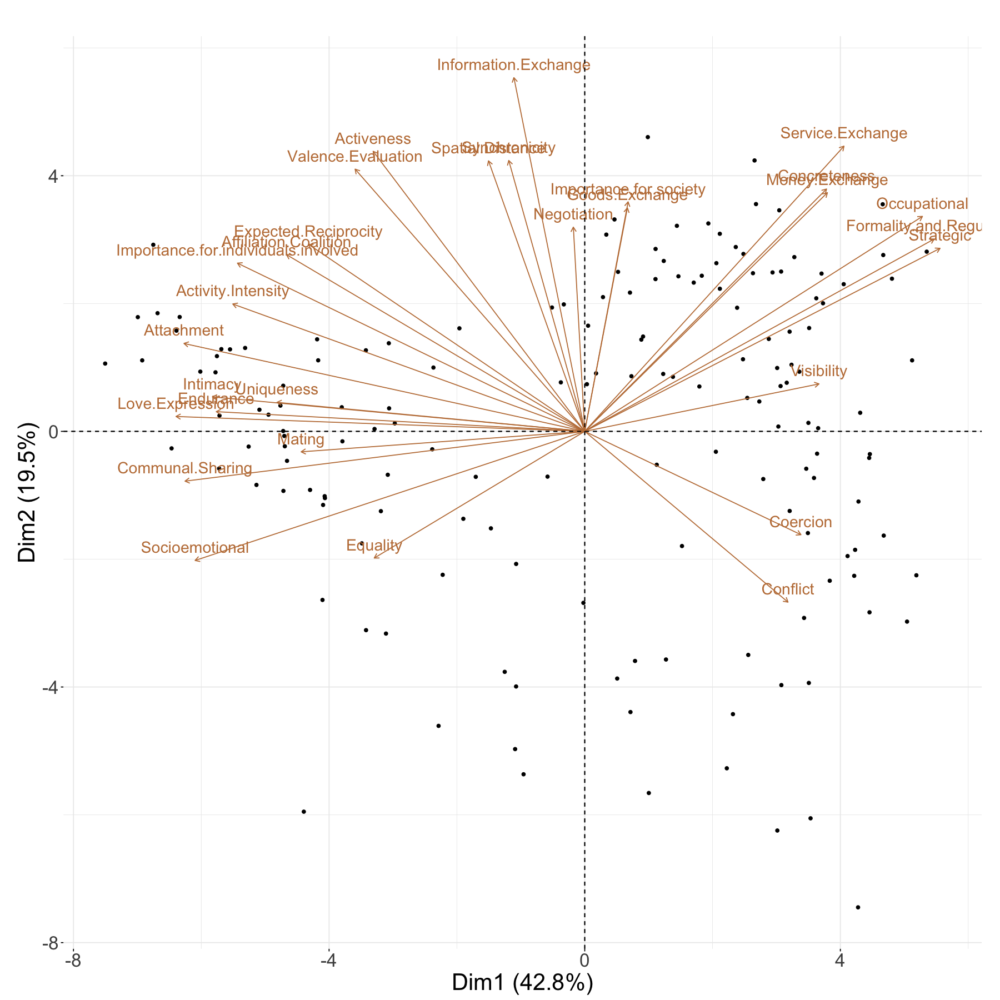

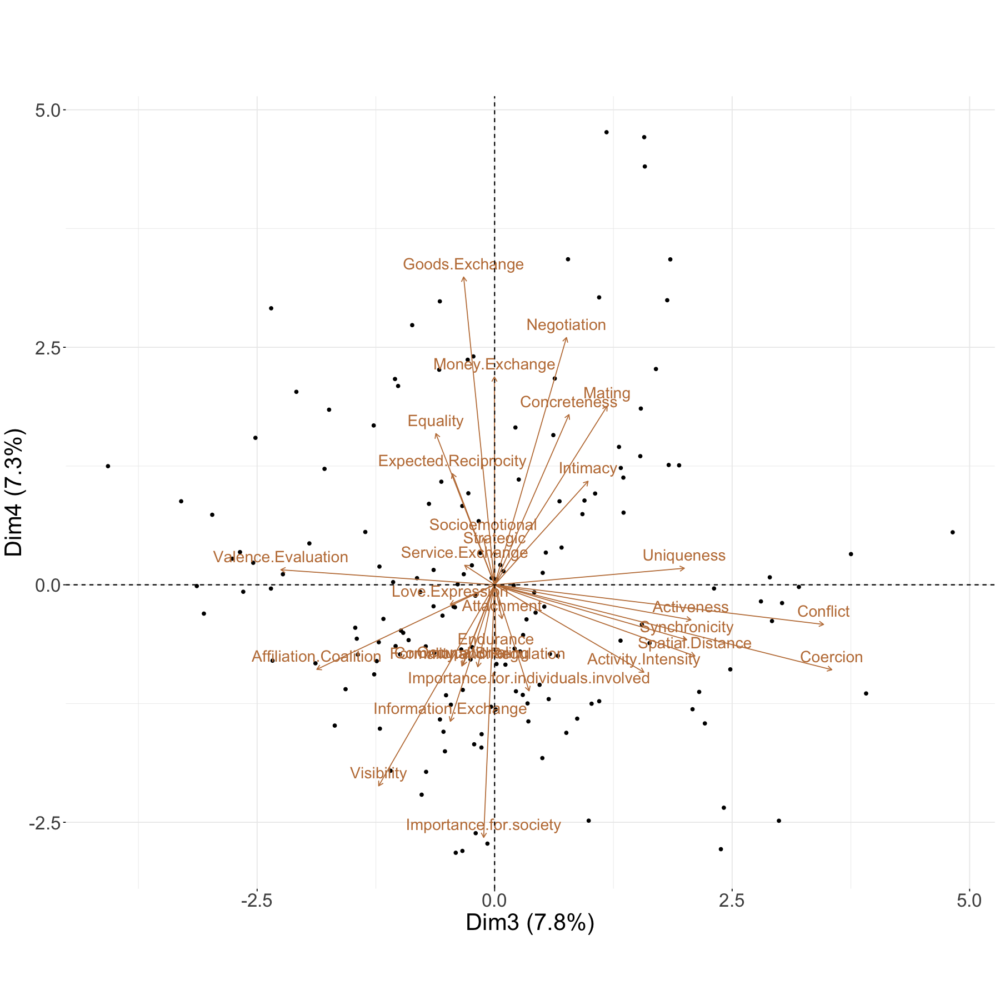

In [45]:
fviz_pca_biplot(pca.res, axes=c(1,2), geom = "point",
labelsize = 6, col.var = "#c07d44") +
coord_fixed() + ggtitle("") +
theme(text = element_text(size = 25))

fviz_pca_biplot(pca.res, axes=c(3,4), geom = "point",
labelsize = 6, col.var = "#c07d44") +
coord_fixed() + ggtitle("") +
theme(text = element_text(size = 25))

# Representational Dissimilarity Matrix
Create distance matrix, with the Euclidean distance measure

## Component 1 - Formality

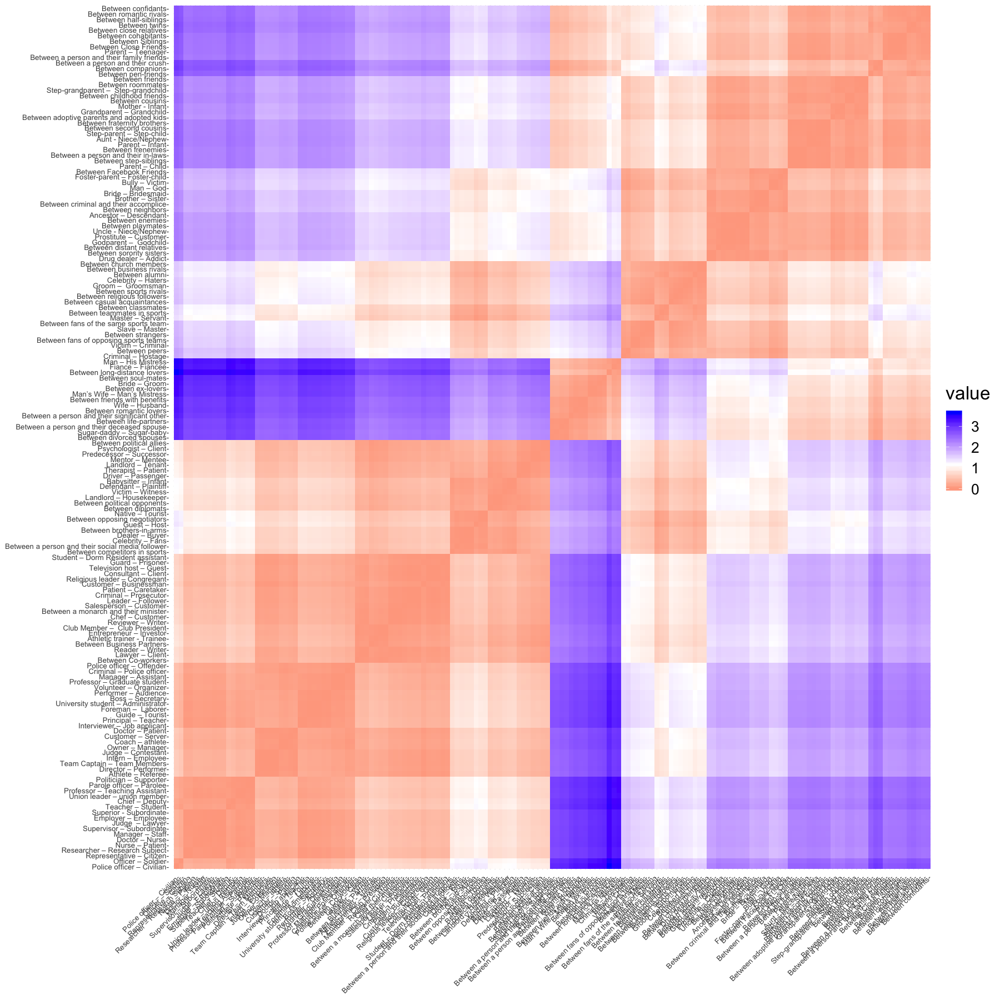

In [90]:
comp1.dist <- get_dist(pv$scores[,1], method = "euclidean")
write.csv(as.data.frame(as.matrix(comp1.dist)), 'results/comp1_dist_matrix.csv')
fviz_dist(comp1.dist, lab_size = 8)

## Component 2 - Concreteness

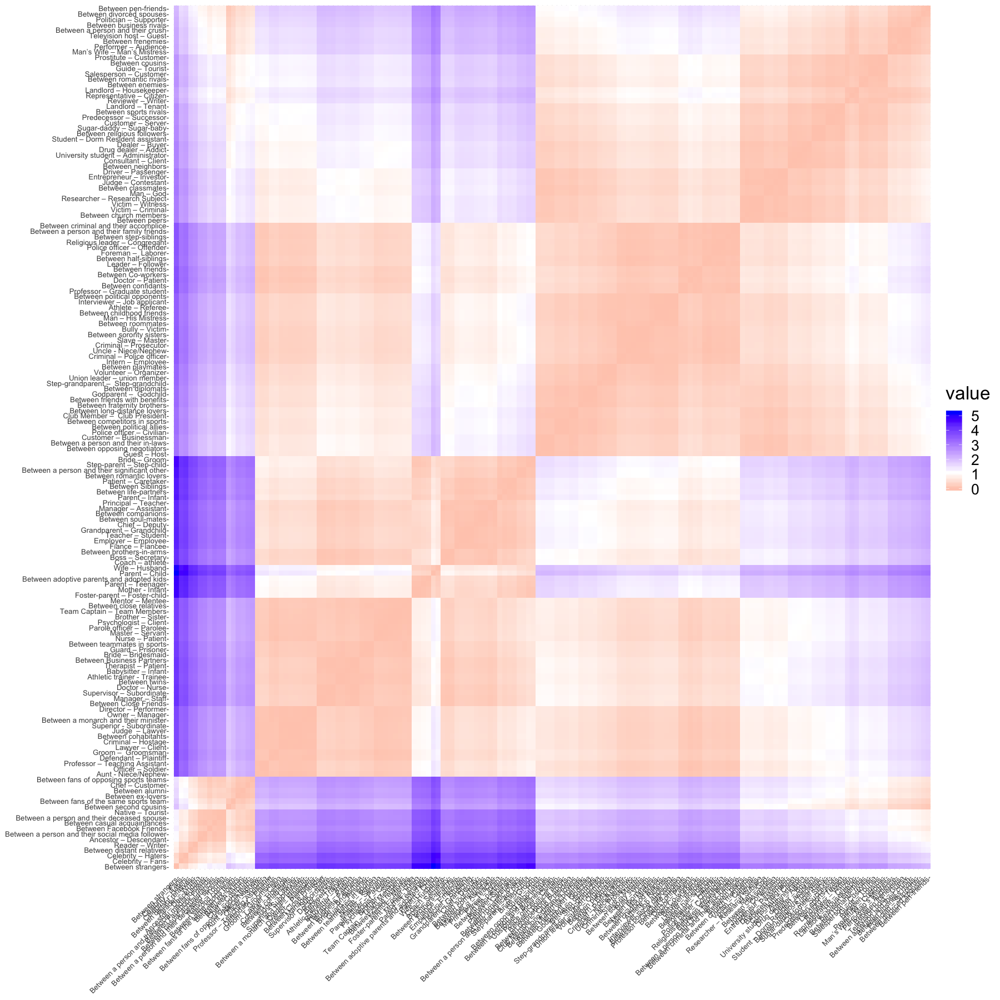

In [91]:
comp2.dist <- get_dist(pv$scores[,2], method = "euclidean")
write.csv(as.data.frame(as.matrix(comp2.dist)), 'results/comp2_dist_matrix.csv')
fviz_dist(comp2.dist, lab_size = 8)

## Component 3 - Conflict & Coercion

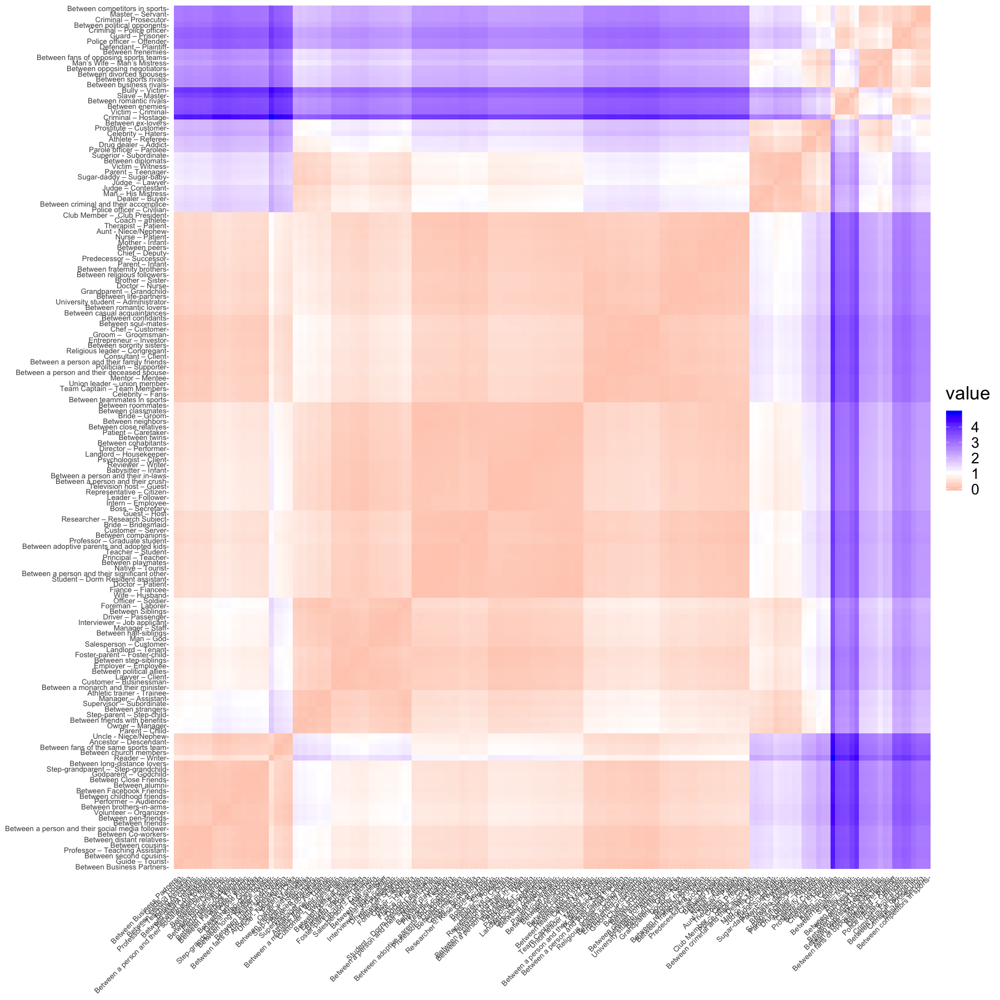

In [92]:
comp3.dist <- get_dist(pv$scores[,3], method = "euclidean")
write.csv(as.data.frame(as.matrix(comp3.dist)), 'results/comp3_dist_matrix.csv')
fviz_dist(comp3.dist, lab_size = 8)

## Component 4 - Societal Importance

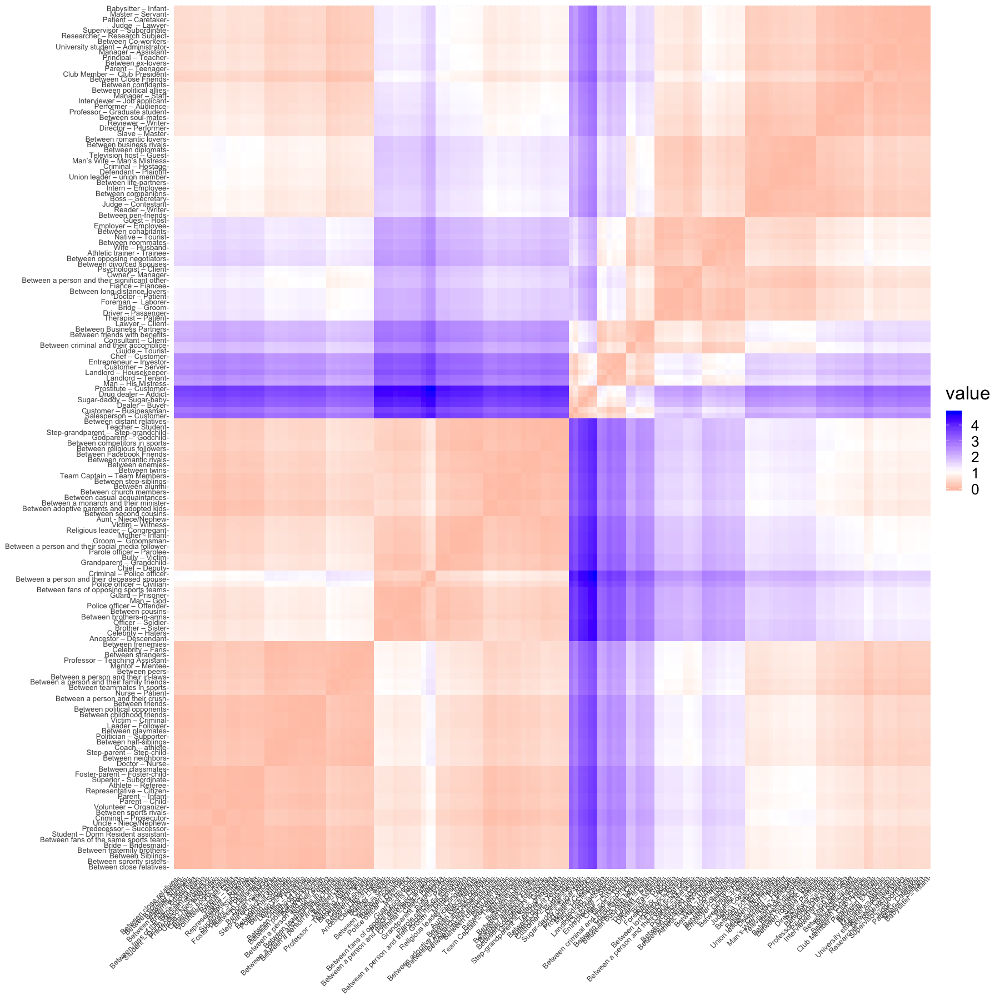

In [93]:
comp4.dist <- get_dist(pv$scores[,4], method = "euclidean")
write.csv(as.data.frame(as.matrix(comp4.dist)), 'results/comp4_dist_matrix.csv')
fviz_dist(comp4.dist, lab_size = 8)